# 4.1 Modeling
Using the LLM + KMeans model identified in 4.0-Modeling, we perform an analysis on the data

In [65]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import importlib
import sys

# setting path
sys.path.append('..')
# importing
from src.models import analysis
importlib.reload(analysis);

# Read Data
all_data = pd.read_csv('../data/final/final_llm_all.csv')
high_school = pd.read_csv('../data/final/final_llm_high.csv')
gps = pd.read_csv('../data/interim/unique_gps.csv')
schools = pd.read_csv('../data/interim/schools.csv')

# Create Models
all_gps_vis = analysis.GPSVisualizer(all_data, gps)
high_gps_vis = analysis.GPSVisualizer(high_school, gps)

## 1 Cluster Label Distribution
Our first step in analysis is to get a sense of how our cluster labels are distributed. Specifically, we are interested to know how balanced they are and whether or not they are time independent

### 1.1 All Data Label Distributions
We observe that the labels are highly imblanaced and that they are not time independent as we had hoped. There are no schools from 2012 that were identified in cluster 3 and in 2011 only 9 schools were identified as cluster 0.

In [8]:
label_count = pd.pivot(all_data.groupby('year')['cluster_label'].value_counts().reset_index(), columns='year', index='cluster_label')
label_count['total'] = label_count.sum(axis=1)
label_count

count                 total
year            2010   2011   2012        
cluster_label                             
0              137.0    9.0  804.0   950.0
1              494.0  390.0  698.0  1582.0
2              538.0  566.0  321.0  1425.0
3              711.0  866.0    NaN  1577.0

### 1.2 High School Label Distributions
The high school label distributions are similarly imbalanced, but they appear to be independent of time which is arguably more important. This class imbalance can still tell us something though. For instance, there could be catchall labels in addition to more specific ones.

In [31]:
label_count = pd.pivot(high_school.groupby('year')['cluster_label'].value_counts().reset_index(), columns='year', index='cluster_label')
label_count['total'] = label_count.sum(axis=1)
label_count

count           total
year           2010 2011 2012      
cluster_label                      
0                56   50   52   158
1                50   44   41   135
2                26   34   20    80
3                25   17   19    61
4                 9    8   13    30

## 2. Geographic Analysis
We are interested to know that by graphing the cluster labels on the map if we can notice any patterns. For instance, do certain labels appear more in metropolitan areas versus remote locations.

### 2.1 All Geographic Analysis
The dependency of time makes this part tricky. In general we observe, the most zeros and twos in Denver Metropolitan Area, but there are no clear and identifiable patterns here

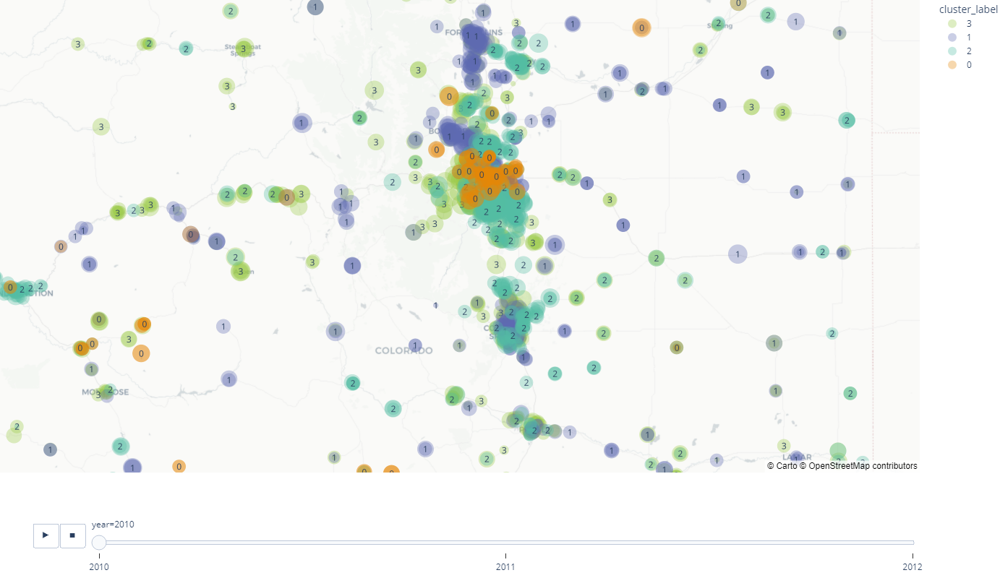

In [79]:
all_gps_vis.visualize()

### High School Geographic Analysis
Again in the high school data set, we do not see any observable patterns on the map

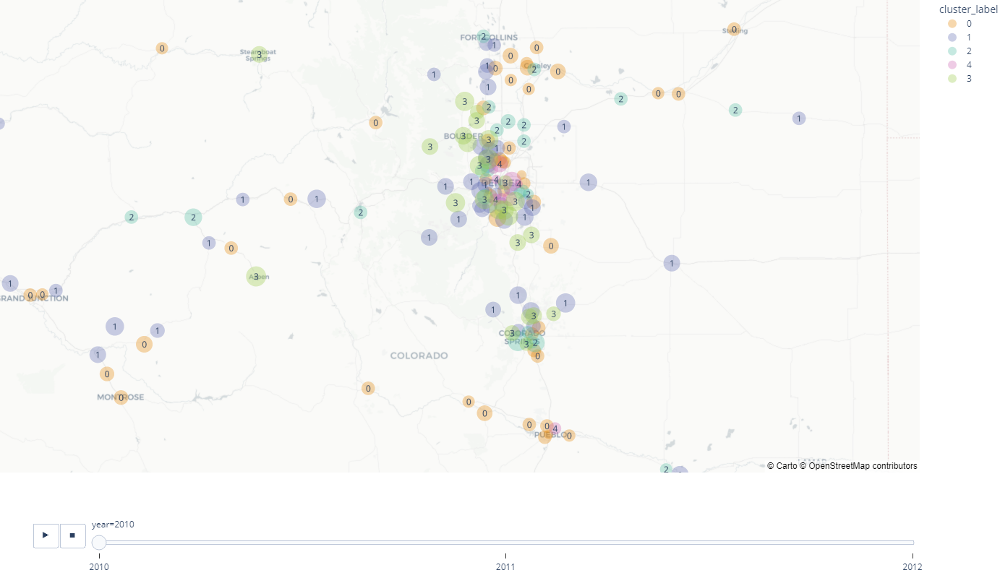

In [80]:
high_gps_vis.visualize()

## 3. Variable Relationships
In this section we are interested in the distribution of cluster labels and relationships between variables. We would like to see if the there are clear ways to distinguish cluster labels across pairs of variables

### 3.1 All Variable Relationships
The only clear pattern we can notice is the distinction between EMH Combined schools and those that are not. There also appears to be differences in the overall direction and school grade distributions

In [82]:
# Top 8 most important columns in determining the cluster labels as given by the gradient boosting model in 4.0-Modeling
all_cols = [
    'emh_combined_True',
    'other_per_pupil',
    'total',
    'child_pov_ratio',
    'child_adult_ratio',
    'pct_white',
    'overall_dir',
    'school_grade',
    'cluster_label'
]

all_vis = analysis.PairPlot(all_data, all_cols)

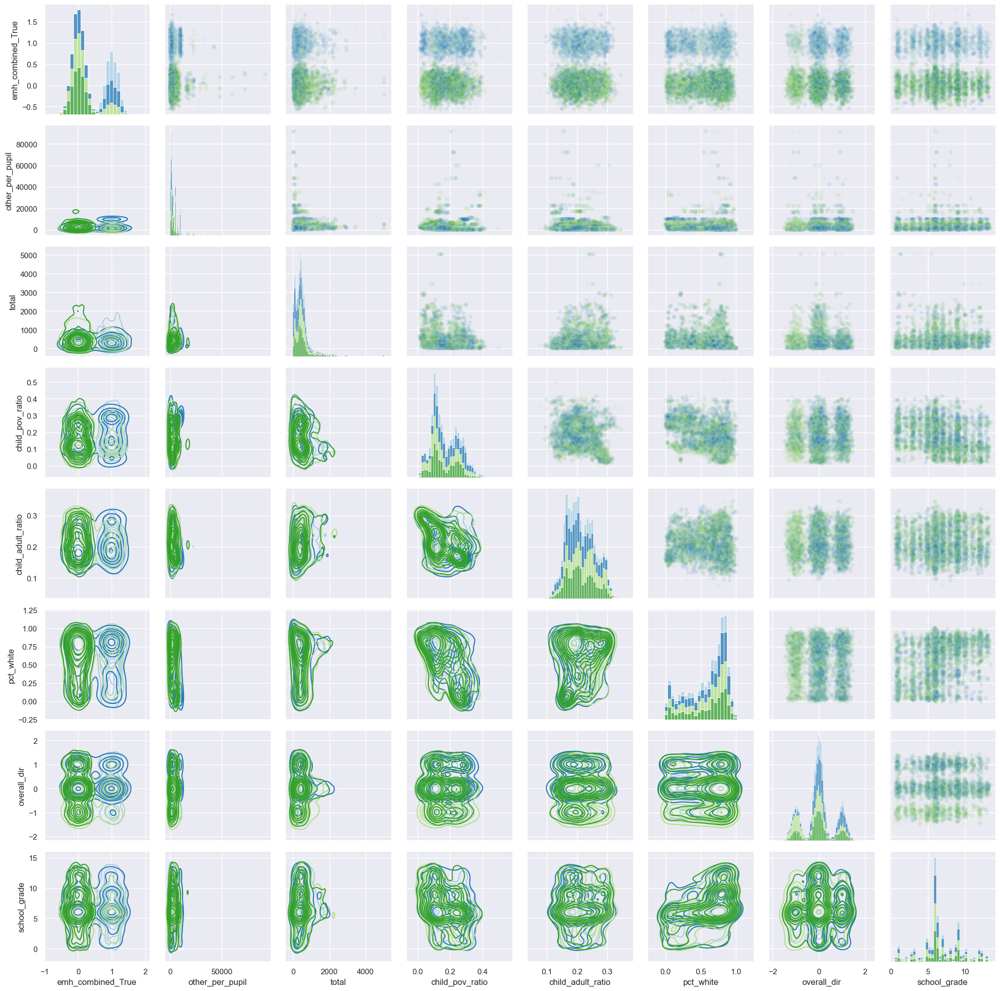

In [66]:
# 4
all_vis.visualize()

In [83]:
for col in all_cols:
    if col != 'cluster_label':
        print(all_data[[col] + ['cluster_label']].groupby('cluster_label').describe().T)

cluster_label                0            1            2       3
emh_combined_True count  950.0  1582.000000  1425.000000  1577.0
                  mean     1.0     0.475348     0.258947     0.0
                  std      0.0     0.499550     0.438210     0.0
                  min      1.0     0.000000     0.000000     0.0
                  25%      1.0     0.000000     0.000000     0.0
                  50%      1.0     0.000000     0.000000     0.0
                  75%      1.0     1.000000     1.000000     0.0
                  max      1.0     1.000000     1.000000     0.0
cluster_label                     0             1             2             3
other_per_pupil count    950.000000   1582.000000   1425.000000   1577.000000
                mean    2599.498947   3007.245259   3532.998596   3688.334813
                std     3366.702740   4854.048236   5878.586885   4704.583481
                min        0.000000      0.000000      0.000000      0.000000
                25%      

After looking at descriptions of each of these columns we no longer believe there is a significant distinction in school grades. While there is a distinction in overall direction and emh_combined. We conclude at this point that we have no further questions for analysis.

### 3.2 High School Variable Relationships
here we notice distinctions in distributions across all features. While it's not clear what those patterns are, we can be confident moving forward with more in depths a

In [29]:
high_cols = [
    'other_per_pupil',
    'child_pov_ratio',
    'graduation_rate',
    'pct_remediation',
    'instruction_per_pupil',
    'pct_asian',
    'child_adult_ratio',
    'school_grade',
    'cluster_label'
]

high_vis = analysis.PairPlot(high_school, cols)

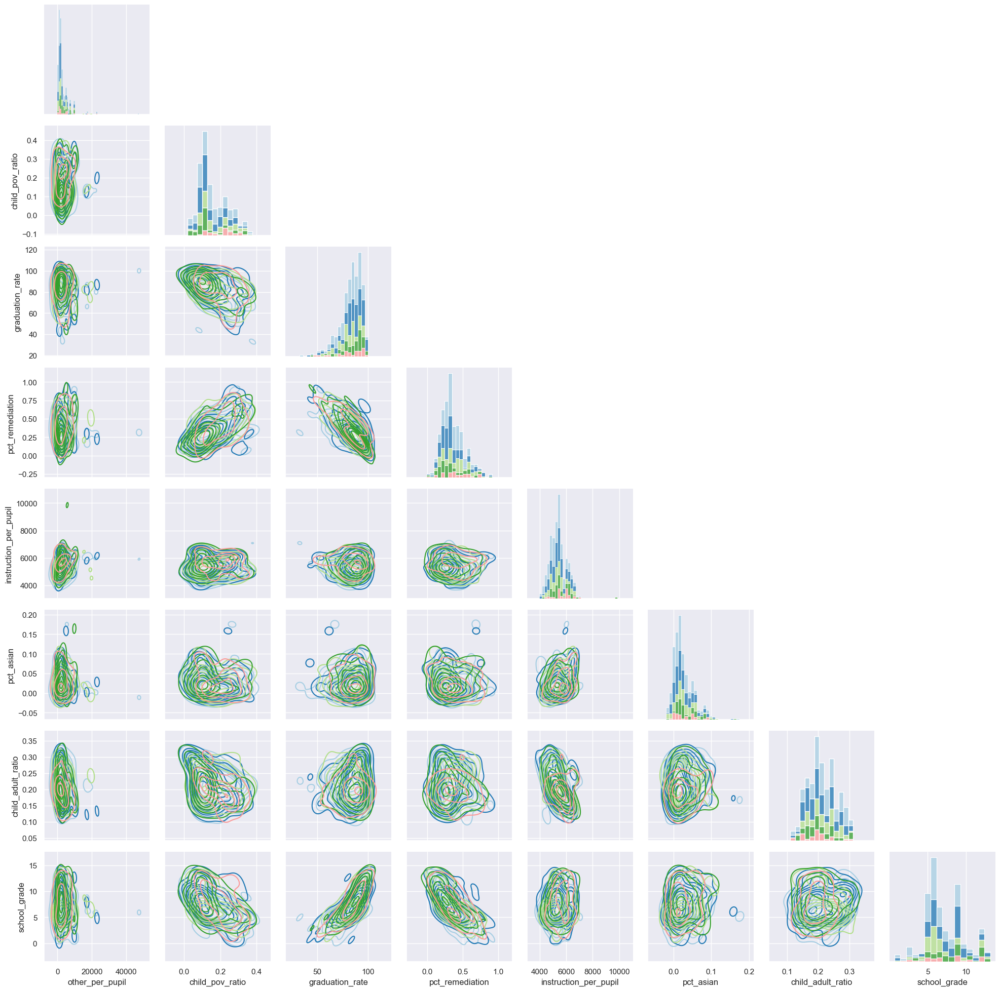

In [30]:
high_vis.visualize()

In [26]:
for col in high_cols:
    if col != 'cluster_label':
        print(high_school[[col] + ['cluster_label']].groupby('cluster_label').describe().T)

cluster_label                     0             1             2            3  \
other_per_pupil count    158.000000    135.000000     80.000000    61.000000   
                mean    3160.164557   2732.362963   3305.562500  3572.803279   
                std     4766.877387   2959.269100   3765.880844  2437.607364   
                min        7.000000      0.000000      7.000000   510.000000   
                25%      929.000000   1100.500000   1054.500000  1679.000000   
                50%     1978.000000   1689.000000   1882.500000  2807.000000   
                75%     3577.500000   3072.000000   4843.000000  4843.000000   
                max    47334.000000  22961.000000  19805.000000  9817.000000   

cluster_label                     4  
other_per_pupil count     30.000000  
                mean    3949.000000  
                std     4904.825471  
                min      510.000000  
                25%     1046.000000  
                50%     2004.000000  
             

At this point, it is clear that our clustering for the high schools has provided us with more information for more thorough analysis. We can see that cluster 3 in particular seems to have the best performance, the least poverty, some of the highest funding, and potentially the least diversity all of which support our initial hypothesis in our exploratory data analysis with cluster 0 in stark contrast to it.

## 4. High School Final Analysis

In [36]:
# X axis of grid will show hues of college readiness for each subject on the ACT
college_readiness = [
    'eng_yn',
    'math_yn',
    'read_yn',
    'sci_yn'
]
college_readiness_names = [
    'English Readiness',
    'Math Readiness',
    'Reading Readiness',
    'Science Readiness'
]

ethnicities = [
    'pct_amind', 
    'pct_asian',
    'pct_black',
    'pct_hisp',
    'pct_white',
    'pct_2ormore'
]
ethnicity_names = [
    'Percent American Indian',
    'Percent Asian',
    'Percent Black',
    'Percent Hispanic',
    'Percent White',
    'Percent Two or More'
]

achievements = [
    'read_achievement', 
    'math_achievement', 
    'write_achievement', 
    'science_achievement',
    'school_grade'
]
achievement_names = [
    'Readng Achievement',
    'Math Achievement',
    'Writing Achievement', 
    'Science Achievement',
    'School Grade'
]

growths = [
    'read_growth',
    'math_growth',
    'write_growth',
    'overall_weighted_growth']
growth_names = [
    'Reading Growth',
    'Math Growth',
    'Writing Growth',
    'Overall Growth'
]

### 4.1 High School Cluster Distributions
These visuals make it easier to interpret the information provided by the describe statement earlier and confirm our interpretation of the data

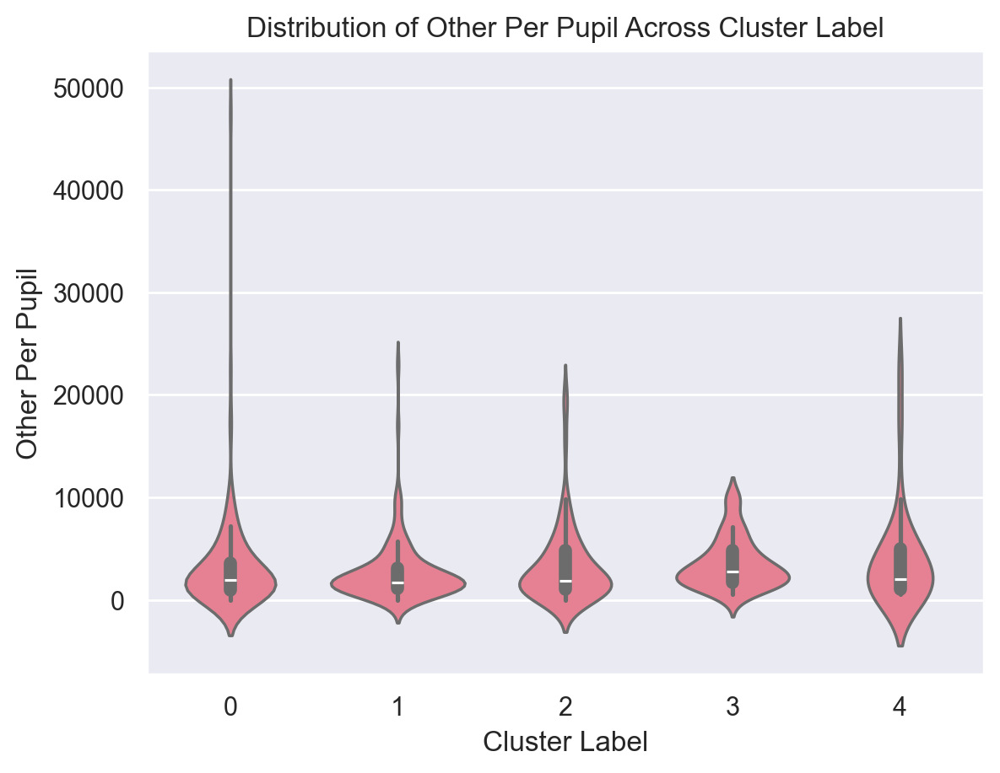

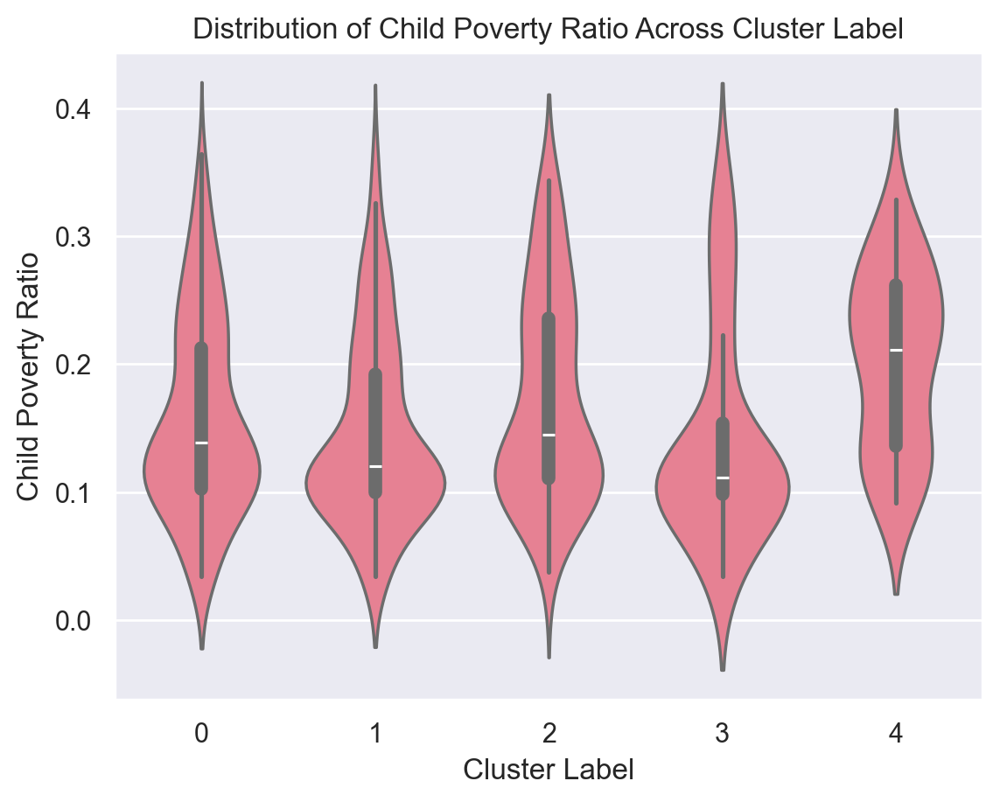

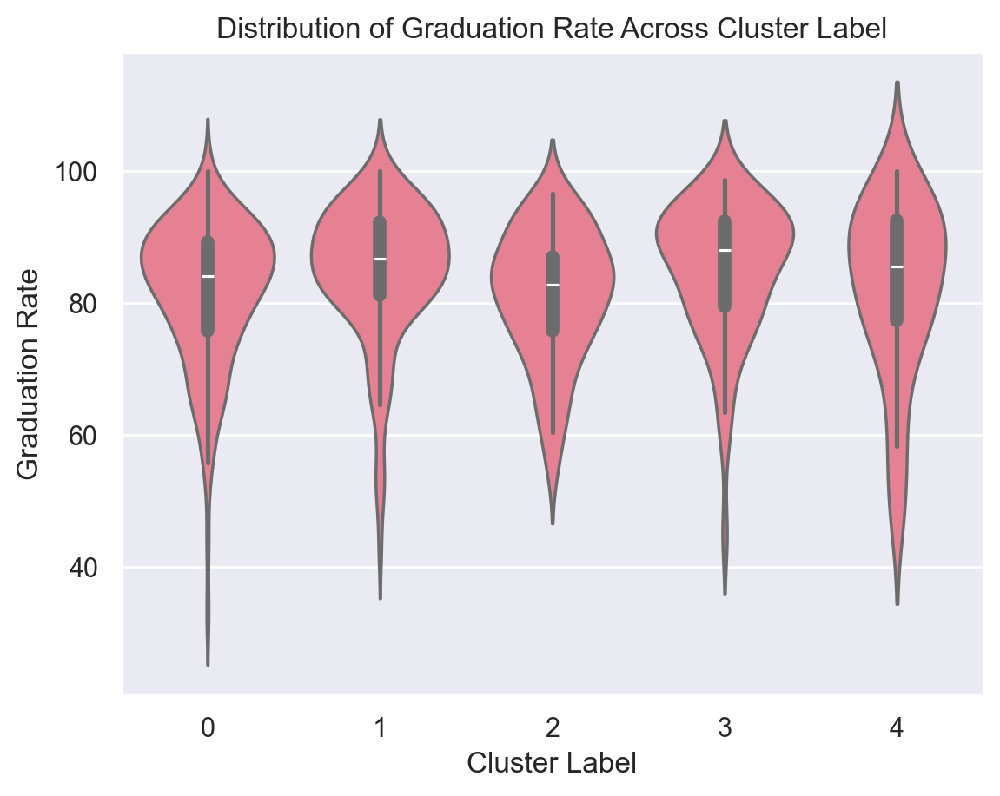

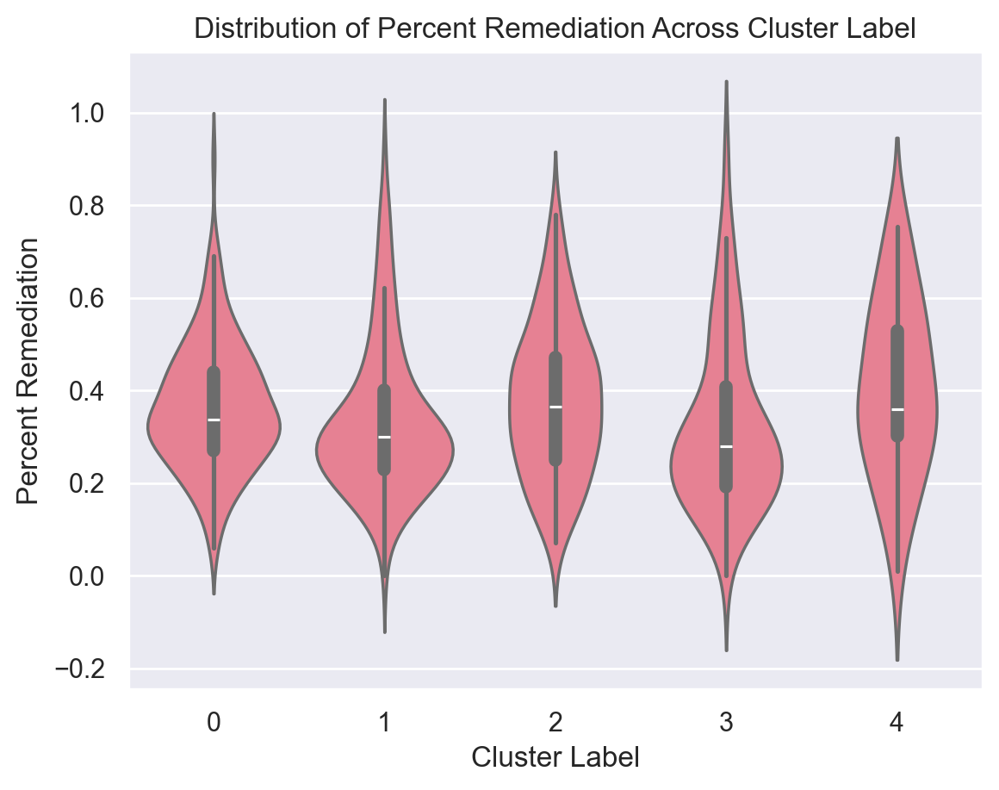

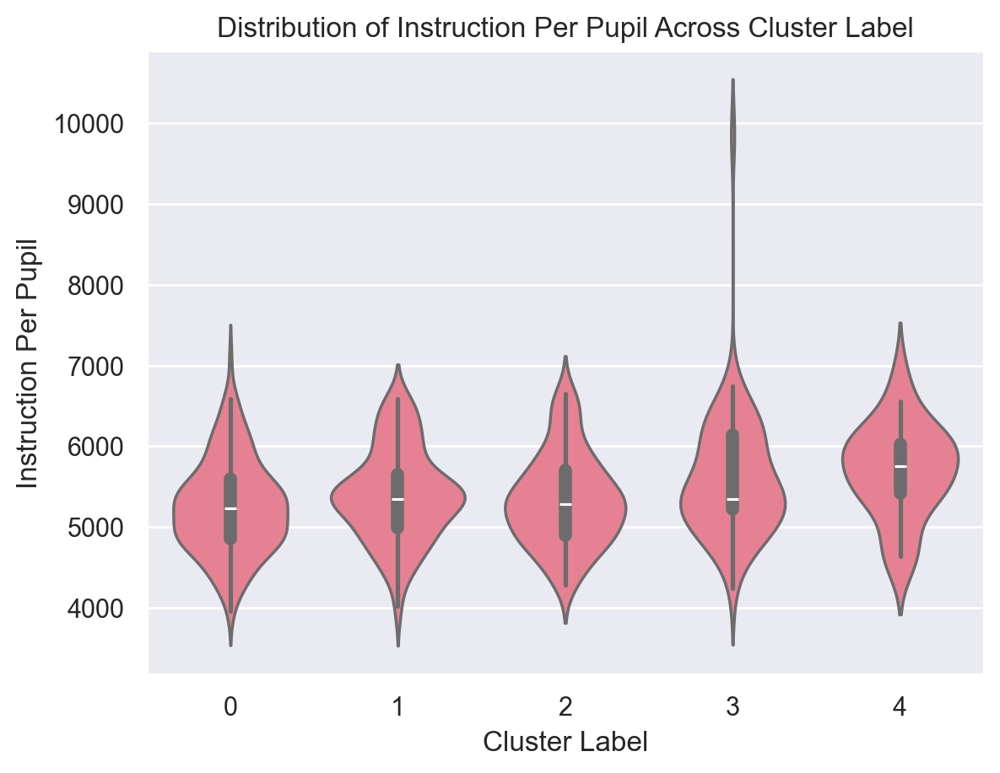

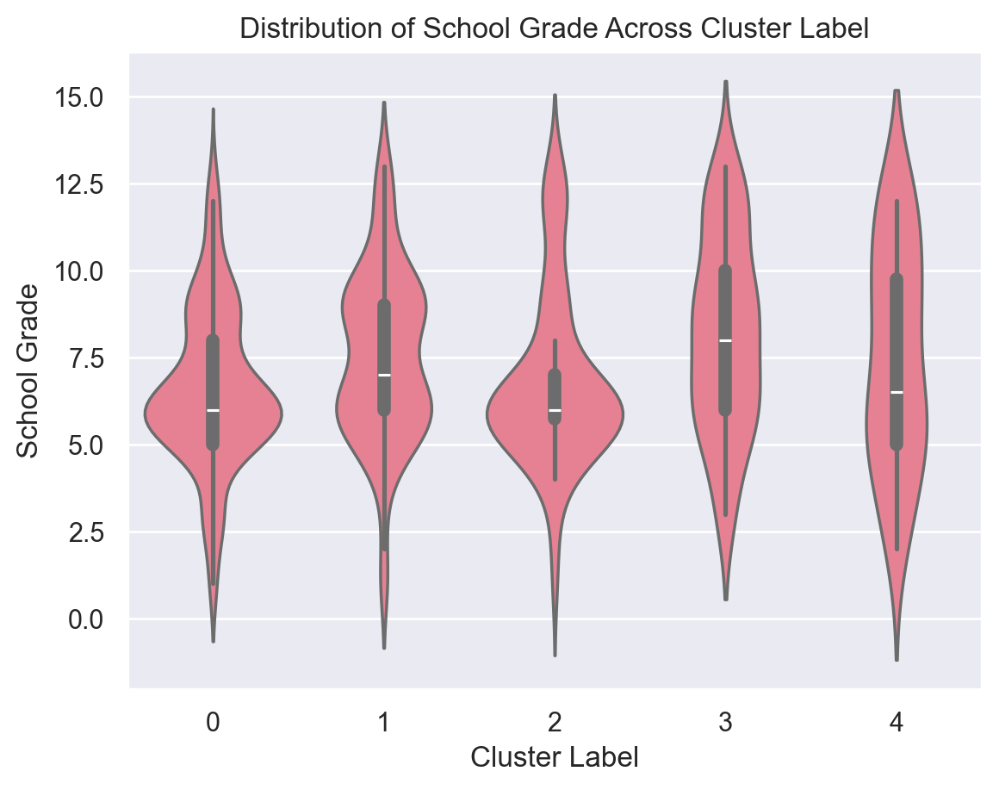

In [88]:
analyze_map = {
    'other_per_pupil': 'Other Per Pupil',
    'child_pov_ratio': 'Child Poverty Ratio',
    'graduation_rate': 'Graduation Rate',
    'pct_remediation': 'Percent Remediation',
    'instruction_per_pupil': 'Instruction Per Pupil',
    'school_grade': 'School Grade'
}
for col, name in analyze_map.items():
    plt.figure(dpi=200)
    plt.title(f'Distribution of {name} Across Cluster Label')
    sns.violinplot(data=high_school, x='cluster_label', y=col)
    plt.xlabel('Cluster Label')
    plt.ylabel(name)
    plt.savefig(f'../reports/figures/cluster_{col}.png')
    plt.show()

### 4.3 Ethnicities and Cluster Labels
This graph across ethnicities also confirms our hypothesis. We can observe that non-white students seem to have a disadvantage at schools. The two highest performing clusters, 1 and 3, have the lowest hispanic population and the highest white population.

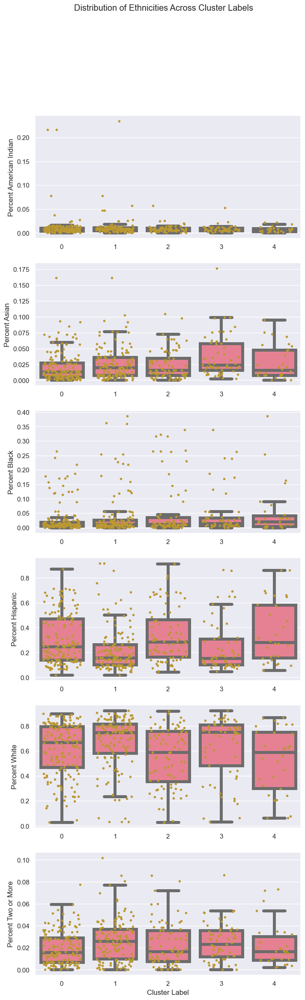

In [89]:
fig, ax = plt.subplots(len(ethnicities), 1, figsize=(8,26), dpi=100)
fig.suptitle('Distribution of Ethnicities Across Cluster Labels')
for i in range(len(ethnicities)):
    sns.boxplot(data=high_school, x='cluster_label', y=ethnicities[i], ax=ax[i], linewidth=5, showfliers=False)
    sns.stripplot(data=high_school, x='cluster_label', y=ethnicities[i], ax=ax[i], jitter=0.35, size=4)
    ax[i].set_xlabel('')
    ax[i].set_ylabel(ethnicity_names[i])
ax[i].set_xlabel('Cluster Label')
plt.savefig('../reports/figures/cluster_ethnicity.png')
plt.show()

### 4.3 Cluster Mobility
Finally we would like to investigate the mobility among clusters. We have already presented evidence that clusters 1 and 3 are the highest performing, while clusters 0, 2, and 4 are lower performing. Now, we want to see how frequently schools remain in the same cluster.

In [77]:
importlib.reload(analysis)
high_repeat_counter = analysis.RepeatCounter(high_school, schools)
high_repeats = []
for i in range(len(high_school['cluster_label'].unique())):
    high_repeats.append(high_repeat_counter.count_repeats(i))

The percentage of schools that stayed in cluster 0 for 2 or more years was 37.61%
The percentage of schools that stayed in cluster 1 for 2 or more years was 25.71%
The percentage of schools that stayed in cluster 2 for 2 or more years was 13.04%
The percentage of schools that stayed in cluster 3 for 2 or more years was 10.91%
The percentage of schools that stayed in cluster 4 for 2 or more years was 15.38%


In [78]:
for i in range(len(high_school['cluster_label'].unique())):
    high_repeats.append(high_repeat_counter.count_repeats(i, 3))

The percentage of schools that stayed in cluster 0 for 3 or more years was 7.34%
The percentage of schools that stayed in cluster 1 for 3 or more years was 2.86%
The percentage of schools that stayed in cluster 2 for 3 or more years was 2.90%
The percentage of schools that stayed in cluster 3 for 3 or more years was 0.00%
The percentage of schools that stayed in cluster 4 for 3 or more years was 0.00%


It seems that cluster 0 has significanlty less mobility than the other clusters. 37% of schools stayed in the cluster for at least two years and 7% stayed in at least three years. Cluster 3 on the other hand had only 10% remain in it for at least two years, and 0% for at least 3 years.

## Conclusion
We have shown that the clustering for all schools did not provide us very usable information. 

The clustering for the high schools, however, supported hypotheses formed in exploratory data analysis. We now believe that communities with more poverty struggle with school more even in cases where there is more funding as shown in cluster 4, but especially when there isn't as shown in cluster 0. Furthermore, we have established that not every students needs are met. There is a concerning disparity between performance of majority white communities and majority non-white communities with a particularly discouraging disparity for hisapnic communities. An additional piece of information that we gained from clustering was that it appears like there is more mobility in the higher performing schools than lower performing schools. While not every school performs well every year, schools that struggle tend to remain struggling particularly for cluster 0 which has the least funds available to spend on instruction for its students.

Overall, it was useful to apply customer segmentation to these schools. It can be difficult as board member to know how to treat each school individually. Our clustering for high schools, can help board members identify broader groups of schools that need help and can guide decisions for a broader group. While there will always be differences in performance across Colorado schools, we would hope to move to a future where that difference is not based on ethnicity, income, or extreme outliers in spending.